# MG MidiAnalysis

In [1]:
import sys
sys.executable

'/home/ubuntu/anaconda3/envs/MusicGenerator1/bin/python'

In [2]:
import pretty_midi
import pandas as pd
import numpy as np
# For plotting
import mir_eval.display
import librosa.display
from music21 import *
import matplotlib.pyplot as plt
%matplotlib inline
# For putting audio in the notebook
import IPython.display

import os

/home/ubuntu/anaconda3/envs/MusicGenerator1/lib/python3.6/site-packages/matplotlib/__init__.py:1057: UserWarning: Duplicate key in file "/home/ubuntu/.config/matplotlib/matplotlibrc", line #2
  (fname, cnt))
/home/ubuntu/anaconda3/envs/MusicGenerator1/lib/python3.6/site-packages/matplotlib/__init__.py:1057: UserWarning: Duplicate key in file "/home/ubuntu/.config/matplotlib/matplotlibrc", line #3
  (fname, cnt))


In [3]:
fs = 16000
rate = 16000
start_pitch = 24
end_pitch = 84

In [4]:
def plot_piano_roll(pm, start_pitch, end_pitch, fs=10):
    # Use librosa's specshow function for displaying the piano roll
    librosa.display.specshow(pm.get_piano_roll(fs)[start_pitch:end_pitch],
                             hop_length=1, sr=fs, x_axis='time', y_axis='cqt_note',
                             fmin=pretty_midi.note_number_to_hz(start_pitch))

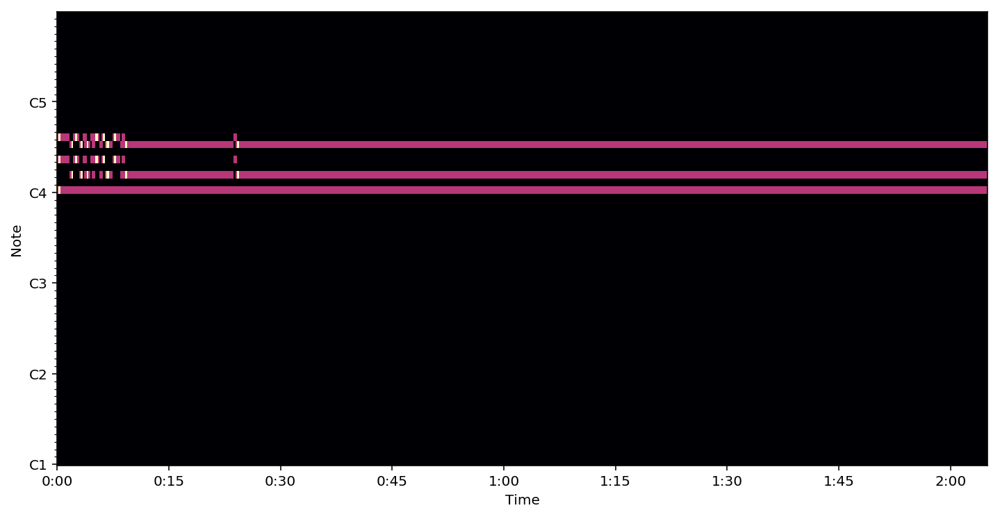

In [5]:
midi_file = '../output/20180322-BritneySpears-lstm_midi-20.mid'
pm = pretty_midi.PrettyMIDI(midi_file)
plt.figure(figsize=(12, 6))
plot_piano_roll(pm, start_pitch, end_pitch)
IPython.display.Audio(pm.synthesize(fs=fs), rate=rate)

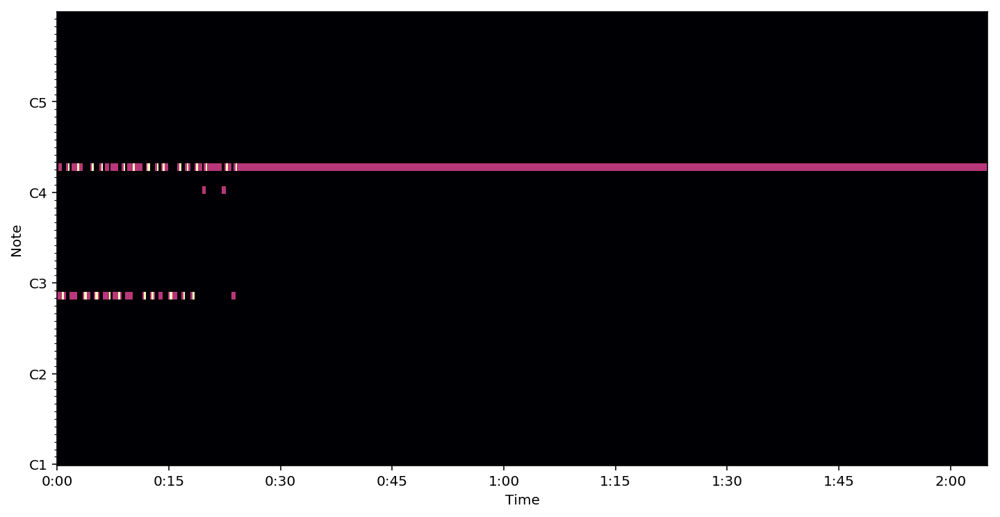

In [6]:
midi_file = '../output/20180322-BritneySpears-lstm_midi-50.mid'
pm = pretty_midi.PrettyMIDI(midi_file)
plt.figure(figsize=(12, 6))
plot_piano_roll(pm, start_pitch, end_pitch)
IPython.display.Audio(pm.synthesize(fs=fs), rate=rate)

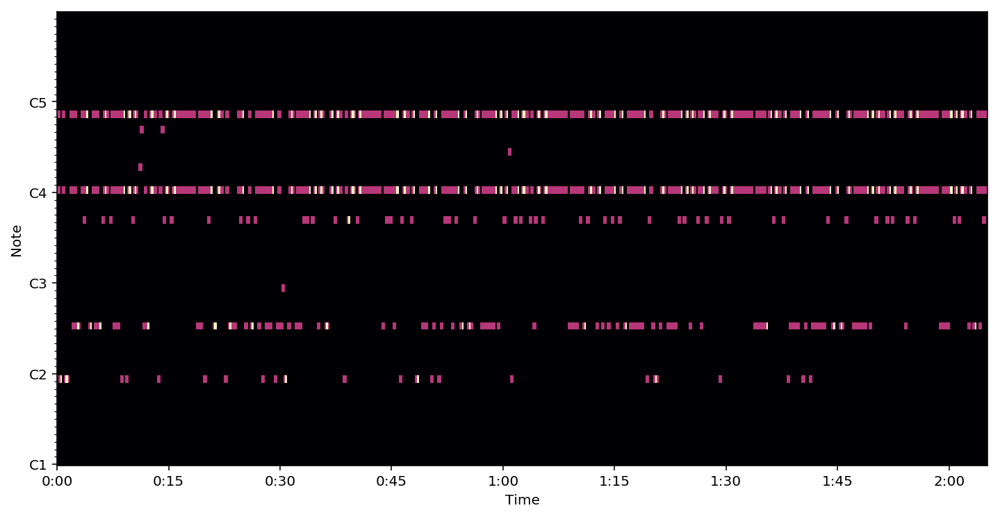

In [11]:
midi_file = '../output/20180323-BritneySpears-lstm_midi-200.mid'
pm = pretty_midi.PrettyMIDI(midi_file)
plt.figure(figsize=(12, 6))
plot_piano_roll(pm, start_pitch, end_pitch)
IPython.display.Audio(pm.synthesize(fs=fs), rate=rate)

In [ ]:
midi_data_folder = '/media/cipher000/DATA/Music/MidiWorld/'
midi_output_folder = '../output/'

midi_file = midi_data_folder + 'BelindaCarlisle-IsaPlaceonEarth.mid'



### Pretty Midi

In [ ]:
# pm = pretty_midi.PrettyMIDI(initial_tempo=80)
pm = pretty_midi.PrettyMIDI(midi_file)

In [ ]:
IPython.display.Audio(pm.synthesize(fs=fs), rate=rate)

In [ ]:
def plot_piano_roll(pm, start_pitch, end_pitch, fs=10):
    # Use librosa's specshow function for displaying the piano roll
    librosa.display.specshow(pm.get_piano_roll(fs)[start_pitch:end_pitch],
                             hop_length=1, sr=fs, x_axis='time', y_axis='cqt_note',
                             fmin=pretty_midi.note_number_to_hz(start_pitch))

plt.figure(figsize=(12, 6))
plot_piano_roll(pm, start_pitch, end_pitch)

In [ ]:
pm.instruments

In [ ]:
inst = pretty_midi.Instrument(program=42, is_drum=False, name='my cello')
pm.instruments.append(inst)

In [ ]:
velocity = 100
for pitch, start, end in zip([60,62,64],[0.2,0.6,1.0],[1.1,1.7,2.3]):
    inst.notes.append(pretty_midi.Note(velocity,pitch,start,end))
print(inst.notes)

In [ ]:
print("Time Signature Changes: {} Instruments: {}".format(len(pm.time_signature_changes), len(pm.instruments)))
instrument_dict = {}
for instrument_num in range(len(pm.instruments)):
    instrument_dict[instrument_num] = {'Notes': len(pm.instruments[instrument_num].notes), 
                                       'Pitch_Bends':len(pm.instruments[instrument_num].pitch_bends),
                                       'Control_Changes':len(pm.instruments[instrument_num].control_changes)}

In [ ]:
instrument_dict = pd.DataFrame(instrument_dict)
instrument_dict

In [ ]:
beats = pm.get_beats()
downbeats = pm.get_downbeats()
plt.figure(figsize=(12,4))
plot_piano_roll(pm, 24,84)
ymin, ymax = plt.ylim()
mir_eval.display.events(beats, base=ymin, height=ymax, color='#AAAAAA')
mir_eval.display.events(downbeats, base=ymin, height=ymax, color='#FFFFFF', lw=2)
plt.xlim(25,45)

In [ ]:
plt.bar(np.arange(12),pm.get_pitch_class_histogram())
plt.xticks(np.arange(12),['C','','D','','E','','F','','G','','A','','B'])
plt.xlabel('Note')
plt.ylabel('Proportion')

### Music21

In [ ]:
fp = midi_file
mf = midi.MidiFile()
mf.open(str(fp))
mf.read()
mf.close()
print(len(mf.tracks))
s = midi.translate.midiFileToStream(mf)
print(len(s.flat.notesAndRests))

In [ ]:
dir(note)

In [ ]:
f = note.Note('F5')

In [ ]:
f.pitch.frequency

In [ ]:
r = note.Rest(type='whole')

In [ ]:
r.show()

In [ ]:
f.show('midi')

In [ ]:
converter.parse('tinynotation: 3/4 c4 d8 f g16 a g f#').show()

### Librosa